<a href="https://colab.research.google.com/github/tomek-l/fire/blob/master/19_07_06_CAM_grad.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Why does the model decide to classify images as 'containing fire' or not?

I use the method from *Grad-CAM* method from [this paper](https://arxiv.org/abs/1610.02391) in order to visualize the approximate locations that excite the network most.

I hope to understand where the network makes mistakes in order to include more such tricky examples in future datasets.



#### Side note:

Had to retrain the model due to a problem with computing gradient in keras.
If one of the layers was a model, I couldn't compute the gradient with respect to layers inside that model. **K.gradients()** call would return None if I try to compute the gradient between nested models.

In [2]:
from google.colab import drive
drive.mount('/gdrive', force_remount=False)

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [3]:
from keras.models import load_model
model = load_model('/gdrive/My Drive/FireVideo/models/VGG_monolth_30epochs.h5')

Using TensorFlow backend.
W0707 13:23:46.709659 140419765000064 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0707 13:23:46.780936 140419765000064 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0707 13:23:46.850440 140419765000064 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0707 13:23:47.351555 140419765000064 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0707 13:23:47.352681 14

In [0]:
from tensorflow.keras.preprocessing import image
import numpy as np

def get_processed_image(img_path):
  img = image.load_img(img_path, target_size=(150, 150))
  img_tensor = image.img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255. #(the network is trained on 0.0-1.0 inputs)
  return img_tensor

In [5]:
#Build graph for CAM-grad process
import keras.backend as K

binary_fire_output = model.output
last_conv_layer = model.get_layer('block5_conv3')
grads = K.gradients(model.output, last_conv_layer.output)[0]
print(grads)
pooled_grads = K.mean(grads, axis=(0, 1, 2))
print(pooled_grads)

Tensor("gradients/block5_pool/MaxPool_grad/MaxPoolGrad:0", shape=(?, 9, 9, 512), dtype=float32)
Tensor("Mean:0", shape=(512,), dtype=float32)


In [7]:
!ls '/gdrive/My Drive/FireVideo/binary_dataset/validation/positives/'

00255.jpg  01696.jpg  03198.jpg  05407.jpg  06716.jpg  07834.jpg  08924.jpg
00289.jpg  01888.jpg  03215.jpg  05518.jpg  06724.jpg  07965.jpg  08944.jpg
00351.jpg  02099.jpg  04512.jpg  05540.jpg  06847.jpg  07966.jpg  09011.jpg
00373.jpg  02211.jpg  04533.jpg  05571.jpg  06962.jpg  07976.jpg  09053.jpg
00377.jpg  02329.jpg  04554.jpg  05598.jpg  07100.jpg  08044.jpg  09069.jpg
00871.jpg  02530.jpg  04584.jpg  05703.jpg  07111.jpg  08144.jpg  09072.jpg
00893.jpg  02665.jpg  04588.jpg  05723.jpg  07215.jpg  08157.jpg  09105.jpg
00930.jpg  02712.jpg  04623.jpg  05821.jpg  07277.jpg  08326.jpg  09108.jpg
01233.jpg  02743.jpg  04665.jpg  05869.jpg  07330.jpg  08439.jpg  09279.jpg
01293.jpg  02765.jpg  04768.jpg  05883.jpg  07581.jpg  08560.jpg
01351.jpg  02776.jpg  04777.jpg  06119.jpg  07637.jpg  08640.jpg
01363.jpg  02800.jpg  05172.jpg  06179.jpg  07690.jpg  08781.jpg
01387.jpg  02899.jpg  05265.jpg  06216.jpg  07751.jpg  08888.jpg
01623.jpg  02985.jpg  05274.jpg  06234.jpg  07832.jpg  0

### Let's try CAM grad process on one image from dataset

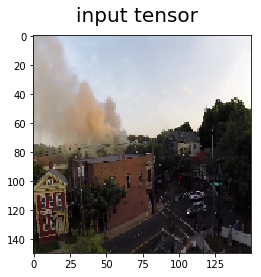

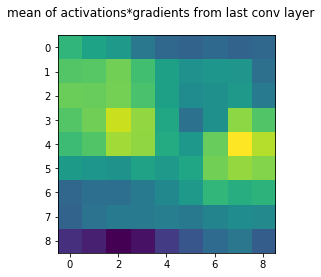

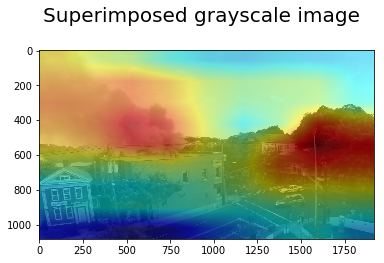

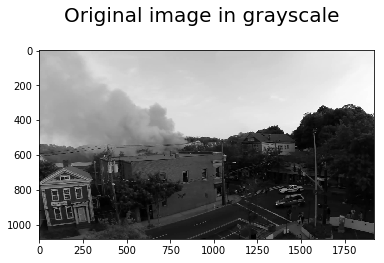

In [20]:
import matplotlib.pyplot as plt
import cv2

img_path =  '/gdrive/My Drive/FireVideo/binary_dataset/validation/positives/00255.jpg'
img_tensor = get_processed_image(img_path)
  
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

am = np.mean(conv_layer_output_value, axis=-1) # activation map

am_amplitude = np.max(am)-np.min(am)
am_min = np.min(am)

am_normalized = (am+np.abs(am_min))/am_amplitude

img = cv2.imread(img_path)
grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
grayimg = cv2.cvtColor(grayimg, cv2.COLOR_GRAY2BGR)

heatmap = cv2.resize(am_normalized, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = np.uint8(0.5* heatmap + 0.5* grayimg)
superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

fig = plt.figure()
fig.suptitle('input tensor', fontsize=20)
plt.imshow(img_tensor[0])
plt.show()


fig = plt.figure()
fig.suptitle('mean of activations*gradients from last conv layer')
plt.imshow(am_normalized)
plt.show()


fig = plt.figure()
fig.suptitle('Superimposed grayscale image', fontsize=20)
plt.imshow(superimposed_img)


fig = plt.figure()
fig.suptitle('Original image in grayscale', fontsize=20)
plt.imshow(grayimg)

#Let's run the process on more pictures

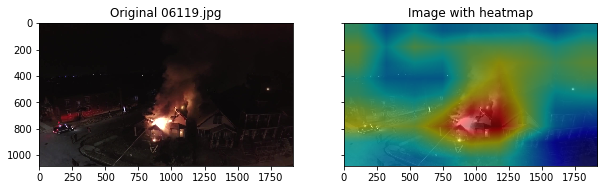

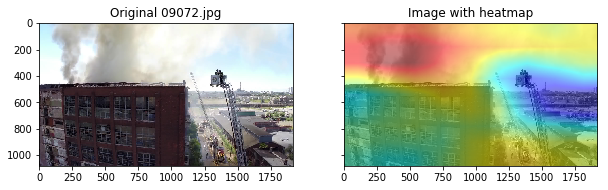

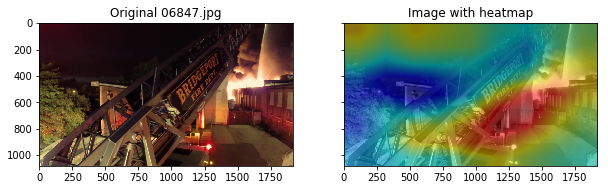

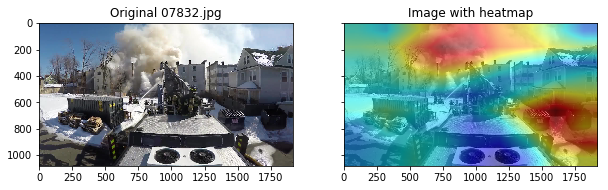

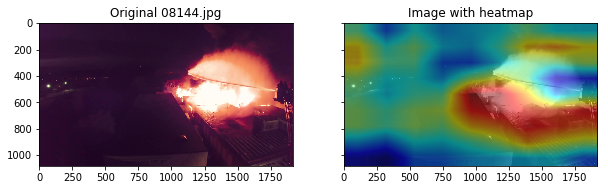

...

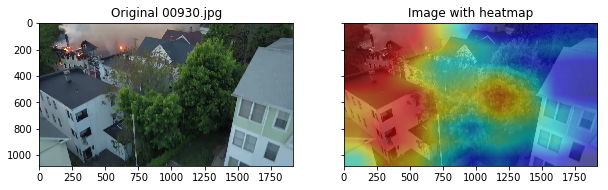

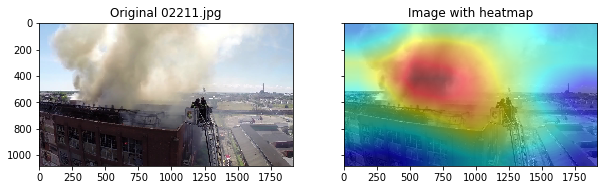

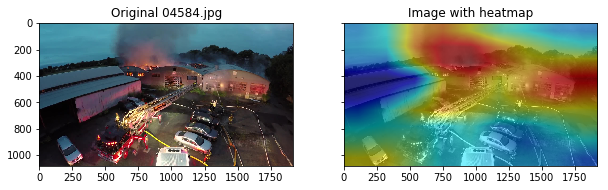

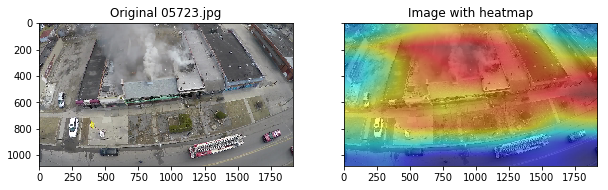

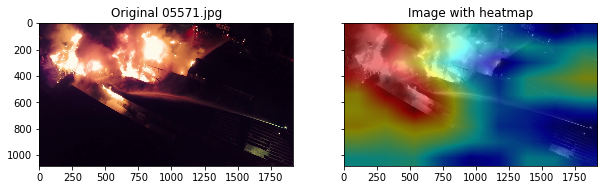

In [28]:
import os

dir = '/gdrive/My Drive/FireVideo/binary_dataset/validation/positives/'

for idx, name in enumerate(os.listdir(dir)):
 
  if idx == 100: break # do just 100 examples
  img_path = dir + name
  img_tensor = get_processed_image(img_path)

  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
  pooled_grads_value, conv_layer_output_value = iterate([img_tensor])
  for i in range(512):
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  heatmap = np.mean(conv_layer_output_value, axis=-1)

  heatmap_amplitude = np.max(heatmap)-np.min(heatmap)
  min_heatmap = np.min(heatmap)

  heatmap = (heatmap+np.abs(min_heatmap))/heatmap_amplitude

  img = cv2.imread(img_path)
  grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  grayimg = cv2.cvtColor(grayimg, cv2.COLOR_GRAY2BGR)
  
  rgbimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
  heatmap = np.uint8(255 * heatmap)

  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  superimposed_img = np.uint8(0.5* heatmap + 0.5* grayimg)
  superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
  
  f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
  ax1.imshow(rgbimg)
  ax1.set_title('Original ' + name)
  ax2.imshow(superimposed_img)  
  ax2.set_title('Image with heatmap')
  
  plt.show()

# Results

The heatmaps are distributed mostly as I'd expect. There are, however on image is a bit surprising: **01696.jpg**. It is classified as fire, but the area with fire has acutally the weakest activations.

Ideas on why that might be:
1. Perhaps there should be more images of vehicles (both on fire and intact). Right now most of the images in the dataset are fires of buildings/property.

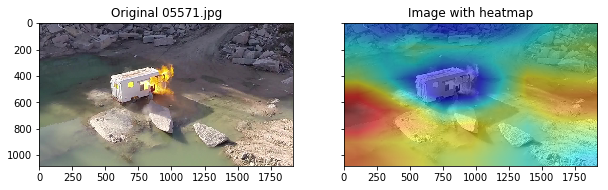

In [33]:
import os

img_path = '/gdrive/My Drive/FireVideo/binary_dataset/validation/positives/01696.jpg'
img_tensor = get_processed_image(img_path)

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([img_tensor])
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

heatmap_amplitude = np.max(heatmap)-np.min(heatmap)
min_heatmap = np.min(heatmap)

heatmap = (heatmap+np.abs(min_heatmap))/heatmap_amplitude

img = cv2.imread(img_path)
grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
grayimg = cv2.cvtColor(grayimg, cv2.COLOR_GRAY2BGR)

rgbimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = np.uint8(0.5* heatmap + 0.5* grayimg)
superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(10, 5))
ax1.imshow(rgbimg)
ax1.set_title('Original ' + name)
ax2.imshow(superimposed_img)  
ax2.set_title('Image with heatmap')

plt.show()